# 2 Network Visualisation

## 2.1



/Users/adityakr/Library/Python/3.12/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/adityakr/Library/Python/3.12/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/var/folders/9s/y0c_yj6d7c1fm05rdc4dnn7c0000gn/T/ipykernel_47647/2020211214.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release,

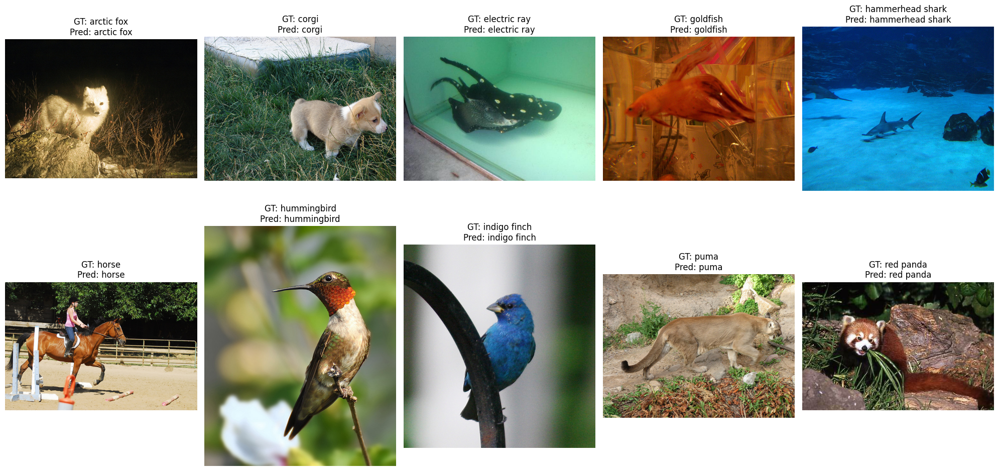

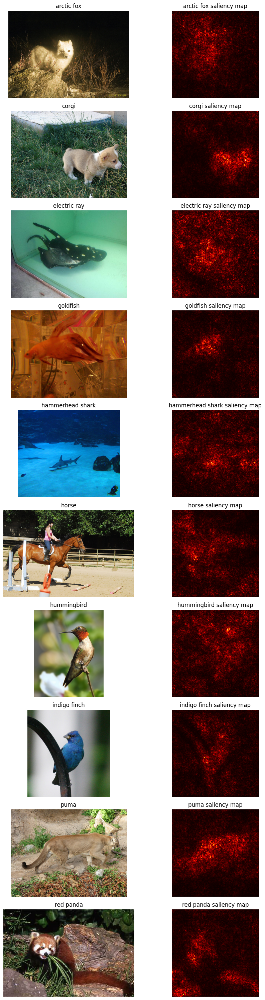

In [2]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# Define preprocessing function
def preprocess_image(img_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(img_path).convert('RGB')
    return transform(image).unsqueeze(0)  # Add batch dimension

# Load modified ResNet18 model
def load_model(weights_path):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(512, 10)  # Modify last FC layer
    model.load_state_dict(torch.load(weights_path, map_location=torch.device('cpu')))
    model.eval()
    return model

# Function to compute saliency map
def compute_saliency(image, model, class_idx):
    image.requires_grad_()
    output = model(image)
    loss = output[0, class_idx]  # Get logit for correct class
    
    model.zero_grad()
    loss.backward()
    
    saliency, _ = torch.max(image.grad.data.abs(), dim=1)  # Get max over channels
    return saliency.squeeze().numpy()

# Load one image per class
base_path = "network visualization"
classes = ["arctic fox", "corgi", "electric ray", "goldfish", "hammerhead shark", 
           "horse", "hummingbird", "indigo finch", "puma", "red panda"]
image_paths = [os.path.join(base_path, cls, f"{cls}_2.JPEG") for cls in classes]

# Load model
model = load_model("network_visualization.pth")

# Process and predict images
selected_images = []
predicted_labels = []

to_pil = transforms.ToPILImage()

# First visualization: Display original images with ground truth and predicted labels
fig1, axes1 = plt.subplots(2, 5, figsize=(20, 10))
axes1 = np.array(axes1).flatten() 
for i, img_path in enumerate(image_paths):
    img = Image.open(img_path).convert('RGB')  # Load raw image
    
    img_tensor = preprocess_image(img_path)
    selected_images.append(img_tensor)
    
    # Predict
    with torch.no_grad():
        output = model(img_tensor)
        pred_label = output.argmax(dim=1).item()
        predicted_labels.append(pred_label)
    
    # Display original image
    axes1[i].imshow(img)
    axes1[i].set_title(f"GT: {classes[i]}\nPred: {classes[pred_label]}")
    axes1[i].axis('off')

plt.tight_layout()
plt.show()

# Second visualization: Display original images alongside saliency maps
fig2, axes2 = plt.subplots(10, 2, figsize=(10, 30))
axes2 = np.array(axes2).flatten() 
for i, img_path in enumerate(image_paths):
    img = Image.open(img_path).convert('RGB')  # Load raw image
    
    # Compute saliency
    saliency_map = compute_saliency(selected_images[i], model, i)
    
    # Display original image
    
    j = 2*i
    axes2[j].imshow(img)
    axes2[j].set_title(f"{classes[i]}")
    axes2[j].axis('off')
    
    # Display saliency map
    axes2[j+1].imshow(saliency_map, cmap='hot')
    axes2[j+1].set_title(f"{classes[i]} saliency map")
    axes2[j+1].axis('off')
    

plt.tight_layout()
plt.show()


In [3]:
# Function to apply masking
def apply_mask(image, saliency_map, mode="black",threshold=0.0):
    threshold = np.quantile(saliency_map, threshold) 
    mask = saliency_map > threshold  # Keep only high-saliency regions

    # Expand mask to match image dimensions: (1, 1, H, W)
    mask = torch.tensor(mask, dtype=torch.bool, device=image.device).unsqueeze(0).unsqueeze(0)  # (1,1,224,224)

    # Clone original image to avoid modifying it in-place
    modified_image = image.clone()

    if mode == "black":
        modified_image *= mask  # Zero out low-saliency pixels
    elif mode == "noise":
        noise = torch.normal(mean=0.0, std=1.0, size=image.shape, device=image.device)  # Generate noise
        modified_image = torch.where(mask, modified_image, noise)  # Replace low-saliency pixels with noise

    return modified_image


# Perform classification on masked images and print results
# threshold = 0.0

for threshold in [0.0, 0.25, 0.5, 0.75, 1]:
    # Classify masked images
    modified_predictions = {"black": [], "noise": []}
    for mode in ["black", "noise"]:
        for i, img_tensor in enumerate(selected_images):
            saliency_map = compute_saliency(img_tensor, model, i)
            modified_img = apply_mask(img_tensor, saliency_map, mode, threshold)
            
            with torch.no_grad():
                output = model(modified_img)
                pred_label = output.argmax(dim=1).item()
                modified_predictions[mode].append(pred_label)

    # Report misclassifications
    print("\n\nMisclassifications after masking for threshold = %.2f:\n" % threshold)
    for mode in ["black", "noise"]:
        misclassified = sum(1 for i in range(len(classes)) if modified_predictions[mode][i] != i)
        print(f"{mode.capitalize()} Masking: {misclassified} images misclassified")




Misclassifications after masking for threshold = 0.00:

Black Masking: 0 images misclassified
Noise Masking: 0 images misclassified


Misclassifications after masking for threshold = 0.25:

Black Masking: 2 images misclassified
Noise Masking: 2 images misclassified


Misclassifications after masking for threshold = 0.50:

Black Masking: 2 images misclassified
Noise Masking: 3 images misclassified


Misclassifications after masking for threshold = 0.75:

Black Masking: 6 images misclassified
Noise Masking: 8 images misclassified


Misclassifications after masking for threshold = 1.00:

Black Masking: 9 images misclassified
Noise Masking: 8 images misclassified


### Threshold:

Here, I have defined threshold as quantile of the range of saliency map values. So, 0.25 threshold means all the pixels with values in lowest 25 percentile are replaced with (0,0,0)/noise. 
As we can see from the outputs, the model misclassifications increase as the threshold is increased. 

### Observations:

- As we can see from the outputs, the model misclassifications increase as the threshold is increased. But even at a high threshold of 0.5, model has only 2 missclassifications in case of (0,0,0) replacement and 3 missclassifications in case of random noise. The reason for this less misclassification even after replacement is, we are replacing the pixels corresponding to low saliencies which means they contribute less towards the correct classification so, replacing them has less impact on classification.  

- Also, here it can be observed missclassification in case of random noise is more than replacing with (0,0,0). The reason could be pixels replaced with (0,0,0) atleast don't give any additional misinformation to the model. But pixels replaced with random noise misguide the model by showing different values than what model expects for a particular class. 


In [ ]:
# print("\nRe-checking predictions on original unmasked images:")
# for i, img_tensor in enumerate(selected_images):
#     with torch.no_grad():
#         output = model(img_tensor)
#         pred_label = output.argmax(dim=1).item()
#         print(f"Image {i+1}: GT: {classes[i]} | Predicted: {classes[pred_label]}")




# # Visualize masked images
# fig3, axes3 = plt.subplots(10, 3, figsize=(15, 30))  # 3 columns: Original, Black Masked, Noise Masked
# axes3 = np.array(axes3).reshape(10, 3)

# for i, img_tensor in enumerate(selected_images):
#     saliency_map = compute_saliency(img_tensor, model, i)
    
#     # Apply both types of masks
#     black_masked_img = apply_mask(img_tensor, saliency_map, mode="black")
#     noise_masked_img = apply_mask(img_tensor, saliency_map, mode="noise")
    
#     # Convert tensors to images for visualization
#     orig_img = Image.open(image_paths[i]).convert('RGB')
#     black_img = to_pil(black_masked_img.squeeze(0))
#     noise_img = to_pil(noise_masked_img.squeeze(0))

#     # Plot original image
#     axes3[i, 0].imshow(orig_img)
#     axes3[i, 0].set_title("Original Image")
#     axes3[i, 0].axis('off')

#     # Plot black-masked image
#     axes3[i, 1].imshow(black_img)
#     axes3[i, 1].set_title("Black Masked")
#     axes3[i, 1].axis('off')

#     # Plot noise-masked image
#     axes3[i, 2].imshow(noise_img)
#     axes3[i, 2].set_title("Noise Masked")
#     axes3[i, 2].axis('off')

# plt.tight_layout()
# plt.show()

## 2.2

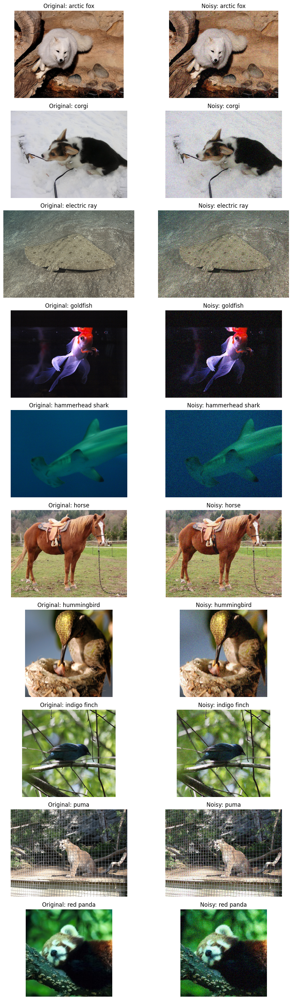

Accuracy after adding noise: 10/10 correctly classified


In [27]:
import torchvision.transforms as transforms

def preprocess_noisy_image(image):
    """Preprocess a noisy PIL image without saving it as a file."""
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return transform(image).unsqueeze(0)  # Add batch dimension



# Load a new set of 10 images (one per class, different from previous ones)
new_image_paths = [os.path.join(base_path, cls, f"{cls}_3.JPEG") for cls in classes]  # Assume different images

# Function to add Gaussian noise to original images (before preprocessing)
def add_gaussian_noise_to_original(image, std=20):
    """Add Gaussian noise to an image before preprocessing."""
    img_np = np.array(image, dtype=np.float32)  # Convert to NumPy array
    noise = np.random.normal(loc=0, scale=std, size=img_np.shape)  # Generate noise
    noisy_img = np.clip(img_np + noise, 0, 255).astype(np.uint8)  # Ensure valid pixel values
    return Image.fromarray(noisy_img)  # Convert back to PIL Image

# Process noisy images
new_selected_images = []
noisy_predictions = []

# Create figure for visualization
fig5, axes5 = plt.subplots(10, 2, figsize=(10, 30))  # Original vs. Noisy Image

for i, img_path in enumerate(new_image_paths):
    orig_img = Image.open(img_path).convert('RGB')  # Load original image
    noisy_img = add_gaussian_noise_to_original(orig_img, std=20)  # Add noise
    

    # # Save the noisy image as a temporary file before preprocessing
    # temp_path = "temp_noisy_image.jpg"  
    # noisy_img.save(temp_path)  



    # Now preprocess using the existing function
    # noisy_img_tensor = preprocess_image(temp_path)

    noisy_img_tensor = preprocess_noisy_image(noisy_img)  # Directly preprocess noisy image


    # # Preprocess the noisy image before passing to model
    # noisy_img_tensor = preprocess_image(noisy_img)
    new_selected_images.append(noisy_img_tensor)

    # Predict with noisy image
    with torch.no_grad():
        output = model(noisy_img_tensor)
        pred_label = output.argmax(dim=1).item()
        noisy_predictions.append(pred_label)

    # Visualization
    axes5[i, 0].imshow(orig_img)
    axes5[i, 0].set_title(f"Original: {classes[i]}")
    axes5[i, 0].axis('off')

    axes5[i, 1].imshow(noisy_img)
    axes5[i, 1].set_title(f"Noisy: {classes[noisy_predictions[-1]]}")
    axes5[i, 1].axis('off')

plt.tight_layout()
plt.show()

# Print accuracy after adding noise
correct = sum(1 for i in range(len(classes)) if noisy_predictions[i] == i)
print(f"Accuracy after adding noise: {correct}/{len(classes)} correctly classified")


next_highest_class electric ray
lowest_class arctic fox


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Original Class: hummingbird
Predicted Class after maximizing next highest logit: electric ray
Predicted Class after maximizing lowest logit: arctic fox


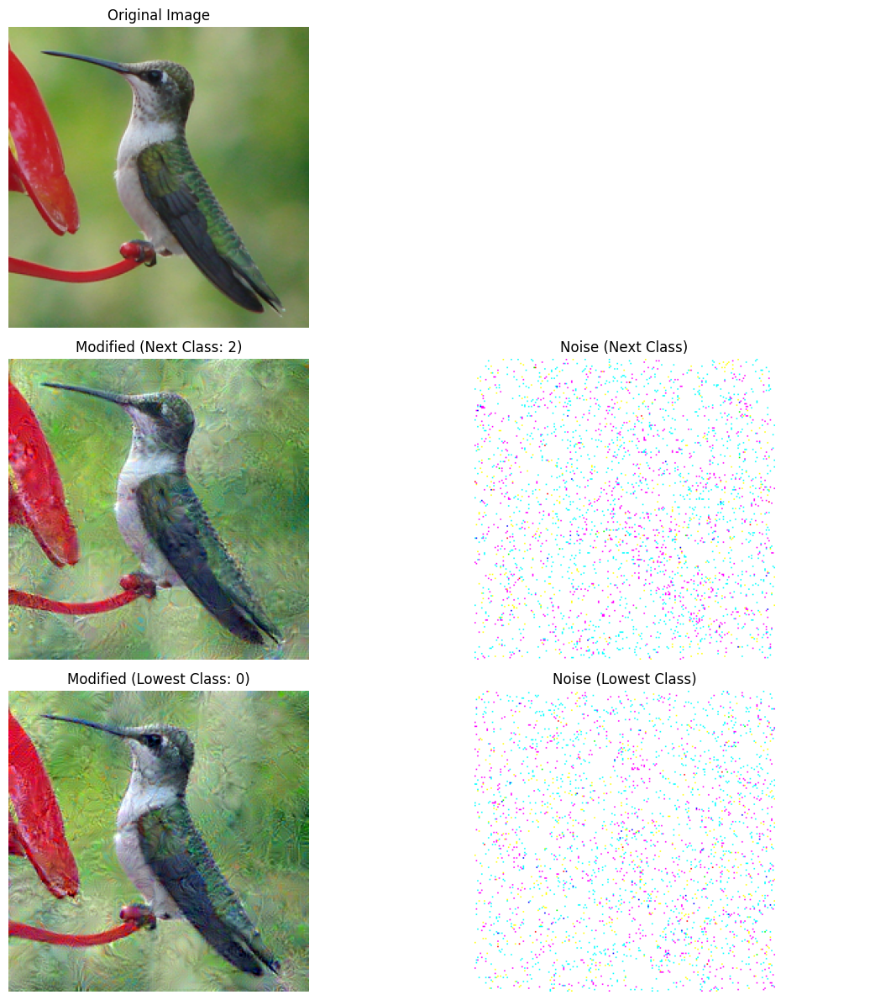

In [42]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Function to preprocess an image
def preprocess_image(image):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return transform(image).unsqueeze(0)  # Add batch dimension

# Function to perform adversarial optimization
def optimize_image(image, model, target_class, epochs=300, lr=0.01):
    image = image.clone().detach().requires_grad_(True)  # Make image a learnable parameter
    optimizer = torch.optim.Adam([image], lr=lr)  # Adam optimizer for image

    for _ in range(epochs):
        optimizer.zero_grad()
        output = model(image)  # Forward pass
        loss = -output[0, target_class]  # Maximize logits for target class
        loss.backward()  # Compute gradients
        optimizer.step()  # Update image

        # Clip image values to valid range after denormalization
        image.data = torch.clamp(image, -2.0, 2.0)  

    return image

# Load an image and preprocess
img_path = "network visualization/hummingbird/hummingbird_4.JPEG"
orig_img = Image.open(img_path).convert('RGB')
input_tensor = preprocess_image(orig_img)

# Get model predictions
with torch.no_grad():
    output = model(input_tensor)
    pred_label = output.argmax(dim=1).item()  # Original prediction

# Get next highest and lowest probability classes
sorted_probs = torch.argsort(output, descending=True)
next_highest_class = sorted_probs[0, 1].item()  # Second most probable class
print("next_highest_class",classes[next_highest_class])
lowest_class = sorted_probs[0, -1].item()  # Least probable class
print("lowest_class",classes[lowest_class])

# Convert images back to displayable format
def tensor_to_image(tensor):
    tensor = tensor.squeeze(0).detach().cpu()  # Remove batch dimension
    tensor = tensor.permute(1, 2, 0).numpy()  # Convert from CHW to HWC
    tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min())  # Normalize to 0-1
    return (tensor * 255).astype(np.uint8)  # Scale to 0-255


# def optimize_and_save():
# Optimize image for the two cases
optimized_next = optimize_image(input_tensor.clone(), model, next_highest_class)
optimized_lowest = optimize_image(input_tensor.clone(), model, lowest_class)


# Convert original image to NumPy and resize to match the model's input size
orig_img_np = np.array(orig_img.resize((224, 224)))
mod_img_next = tensor_to_image(optimized_next)
mod_img_lowest = tensor_to_image(optimized_lowest)


noise_next = np.abs(mod_img_next.astype(np.float32) - orig_img_np.astype(np.float32))
noise_lowest = np.abs(mod_img_lowest.astype(np.float32) - orig_img_np.astype(np.float32))


mod_img_next = Image.fromarray(mod_img_next.astype(np.uint8))
mod_img_lowest = Image.fromarray(mod_img_lowest.astype(np.uint8))

mod_img_next.save("optimized_next_highest.jpg")
mod_img_lowest.save("optimized_lowest.jpg")

# optimize_and_save()  

# Convert modified images to tensors for model inference
optimized_next_tensor = preprocess_noisy_image(Image.open("optimized_next_highest.jpg").convert('RGB'))
optimized_lowest_tensor = preprocess_noisy_image(Image.open("optimized_lowest.jpg").convert('RGB'))
# optimized_next_tensor = preprocess_noisy_image(Image.fromarray(tensor_to_image(optimized_next).astype(np.uint8)))
# optimized_lowest_tensor = preprocess_noisy_image(Image.fromarray(tensor_to_image(optimized_lowest).astype(np.uint8)))

# Predict using the model
with torch.no_grad():
    output_next = model(optimized_next_tensor)
    output_lowest = model(optimized_lowest_tensor)

    pred_next = output_next.argmax(dim=1).item()
    pred_lowest = output_lowest.argmax(dim=1).item()
    
true_label=6 # hummingbird
# Print classification results
print(f"Original Class: {classes[true_label]}")
print(f"Predicted Class after maximizing next highest logit: {classes[pred_next]}")
print(f"Predicted Class after maximizing lowest logit: {classes[pred_lowest]}")



# Visualize results
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
axes = np.array(axes).flatten() 

# Original Image
axes[0].imshow(orig_img_np)
axes[0].set_title("Original Image")
axes[0].axis('off')
axes[1].axis('off')

# Modified Image (Next Highest Class)
axes[2].imshow(mod_img_next)
axes[2].set_title(f"Modified (Next Class: {next_highest_class})")
axes[2].axis('off')

# Noise (Next Highest Class)
axes[3].imshow(noise_next, cmap="gray")
axes[3].set_title("Noise (Next Class)")
axes[3].axis('off')

# Modified Image (Lowest Class)
axes[4].imshow(mod_img_lowest)
axes[4].set_title(f"Modified (Lowest Class: {lowest_class})")
axes[4].axis('off')

# Noise (Lowest Class)
axes[5].imshow(noise_lowest, cmap="gray")
axes[5].set_title("Noise (Lowest Class)")
axes[5].axis('off')

plt.tight_layout()
plt.show()


### Comparison:

The final images in both cases are qute different from the original images. In both the cases the random noise added have kind patchy blurr effect on the original image. But this small noise making the model to misclassify the image as we have designed the noise. 

